## КАРТОГРАФИЯ И ДЕТЕКТИРОВАНИЕ ДОРОЖНЫХ ОБЪЕКТОВ 🚗🛣️🚦

В этом задании вам предстоит решить несколько задач, связанных с дорожной инфраструктурой! Вы научитесь распознавать дороги на спутниковых снимках, строить по ним графы дорожных сетей, детектировать и классифицировать объекты на дорогах. А в конце протестируете свои модели в реальных условиях Долгопрудного!


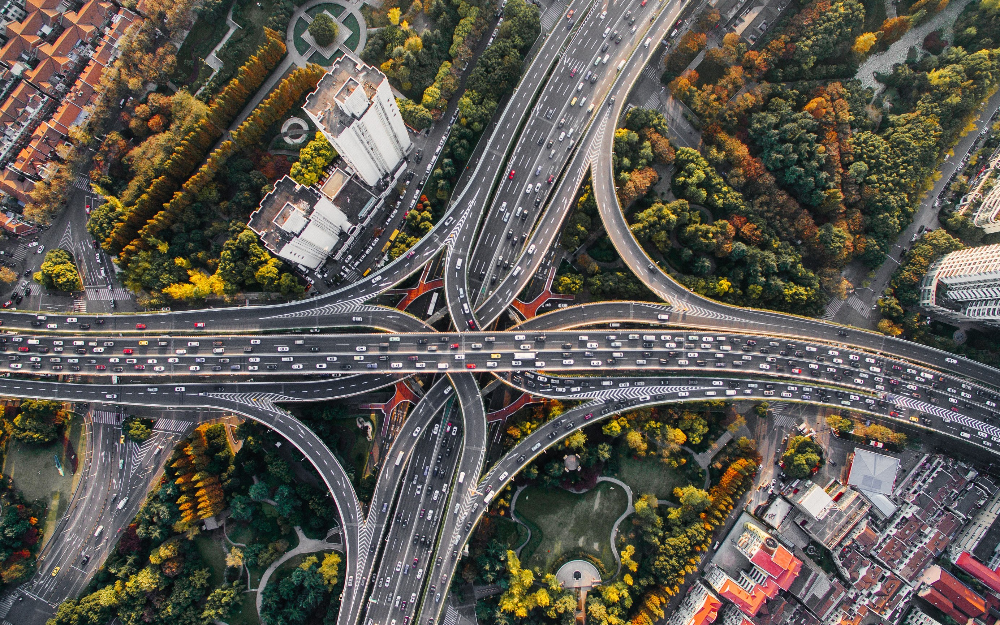

*Предисловие к 1 и 2 частям*

Задача автоматического распознавания дорог и построения графов дорожной сети по спутниковым снимкам имеет множество практических применений: от обновления картографических сервисов до планирования городской инфраструктуры и анализа транспортной доступности районов.

### Часть 1. Сегментация дорог на спутниковых снимках 🛰️

В этой части вам предстоит обучить модель сегментации дорог, которая сможет автоматически выделять дороги на спутниковых изображениях.

#### Этапы работы
1. **Подготовка данных.** Соберите коллекцию датасетов для обучения. Рекомендуется использовать несколько датасетов для повышения обобщающей способности модели. Можете рассмотреть следующие датасеты:
    - [DeepGlobe Road Extraction Dataset](https://www.kaggle.com/datasets/balraj98/deepglobe-road-extraction-dataset),
    - [Massachusetts Roads Dataset](https://www.kaggle.com/datasets/balraj98/massachusetts-roads-dataset),
    - [road_network_Detection_Mumbai_city_Dataset](https://www.kaggle.com/datasets/yash0309/road-network-detection-mumbai-city-dataset),
    - Любые другие подходящие датасеты по вашему выбору.

2. **Эксперименты с моделями.** Проведите различные эксперименты по обучению моделей, попробуйте разные архитектуры, например:
    - U-Net,
    - DeepLabV3,
    - Любые другие архитектуры по вашему выбору.

    Рекомендуется логировать все эксперименты с графиками лосса, метрик и примерами сгенерированных масок в удобной платформе, такой как [Weights & Biases](https://wandb.ai/). Это поможет лучше ориентироваться в экспериментах, сравнивать результаты и находить оптимальные параметры. За хорошо оформленное логирование 1 и 3 частей этого задания можно получить до 20 бонусных баллов (не забудьте прикрепить ссылку на проект и открыть к нему доступ).

3.  **Применение модели к Долгопрудному**
    - Скачайте спутниковые снимки части Долгопрудного (в частности, кампуса Физтеха) с Яндекс.Карт или других источников.
    - Разбейте изображение на части, примените модель сегментации к каждой части и соберите полученные маски обратно.
    - Вероятно у вас останутся "швы" на стыках масок. Попробуйте различные подходы, чтобы от них избавиться:
        * Перекрытие: Разбивайте изображение с небольшим перекрытием, а затем усредняйте маски в областях перекрытия.
        * Сглаживание: Используйте фильтры сглаживания (например, гауссовский) на краях масок.
        * Любые другие идеи, за вдохновением можно обращаться к LLM (например, к [DeepSeek](https://chat.deepseek.com)).


In [1]:
# Утилиты стандартной библиотеки
from functools import lru_cache
import os
import glob

# Библиотеки для анализа данных
import numpy as np
import time
from collections import defaultdict
from IPython.display import clear_output
from tqdm.notebook import tqdm
from monai.losses import DiceLoss, TverskyLoss
import pandas as pd

# Библиотеки для обработки изображений
import cv2
from PIL import Image
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader

# Библиотеки для визуализации
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

# Библиотеки для обучения
import pytorch_lightning as pl

import torch
from torchmetrics import JaccardIndex
from torch import nn
from torch.utils.data import Dataset, DataLoader

from torchvision import models
from sklearn.model_selection import train_test_split

import wandb
import albumentations

/home/juequ/.local/lib/python3.10/site-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.21). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


Посмотрим на маску и само изображение

(1024, 1024)


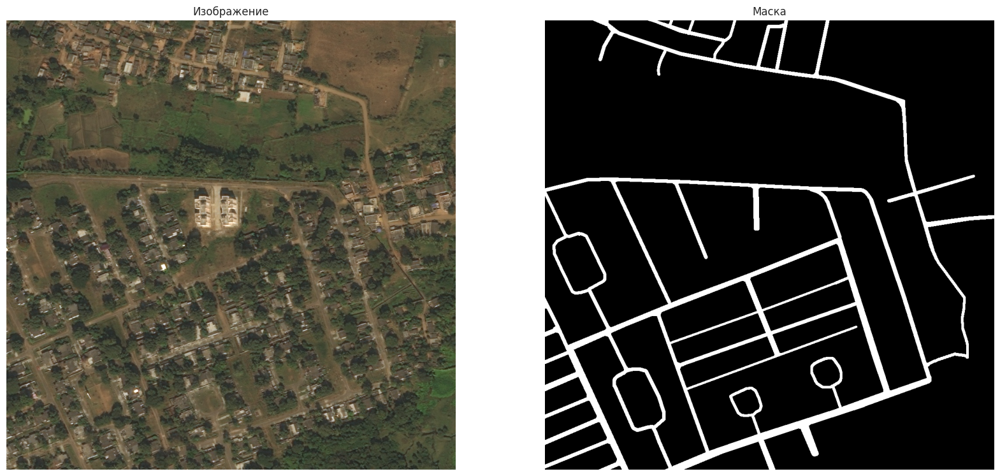

In [2]:
img_path = 'deepglobe-road-extraction-dataset/train/22856_sat.jpg'
mask_path = 'deepglobe-road-extraction-dataset/train/22856_mask.png'

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Изображение")
plt.imshow(Image.open(img_path))
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Маска")
plt.imshow(Image.open(mask_path))
plt.axis("off")

print(Image.open(img_path).size)

Датасет

In [3]:
class RoadDataset(Dataset):
    def __init__(self, images_filenames, images_directory, masks_directory,  transform=None):
        '''Задаем аугментации и пути к картинкам и маскам'''
        self.images_filenames = images_filenames
        self.images_directory = images_directory
        self.masks_directory = masks_directory
        self.transform = transform

    def __len__(self):
        return len(self.images_filenames)

    def _get_image_mask(self, image_filename):
        '''Получим картинку и маску для файла image_filename'''
        image_path = os.path.join(self.images_directory, image_filename)
        mask_filename = image_filename.rsplit('_', maxsplit=1)[0] + "_mask.png"
        mask_path = os.path.join(self.masks_directory, mask_filename)
        
        image = Image.open(image_path).convert("RGB")
        mask = Image.open(mask_path).convert("L")
        return image, mask

    def __getitem__(self, idx):
        '''Получим картинку и маску индекса idx'''
        image_filename = self.images_filenames[idx]
        image, mask = self._get_image_mask(image_filename)

        image = np.array(image)
        mask = np.array(mask)
    
        # Применяем трансформацию (аугментацию), если это необходимо
        if self.transform is not None:
            transformed = self.transform(image=image, mask=mask)
            image = transformed["image"].float()
            mask = transformed["mask"].float()

        mask = torch.where(mask > 0, 1, 0).float()
        return image, mask

Аугментации

In [4]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.Resize(256, 256),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, p=0.5),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(256, 256),
    ToTensorV2(),
])

Инициализация датасетов

In [5]:
from sklearn.model_selection import train_test_split

data_path = 'deepglobe-road-extraction-dataset'
train_images_dir = os.path.join(data_path, "train")
train_masks_dir = os.path.join(data_path, "train")
val_images_dir = os.path.join(data_path, "train")
val_masks_dir = os.path.join(data_path, "train")

train_images_filenames = [f for f in os.listdir(train_images_dir) if f.endswith(".jpg")]

train_images_filenames, val_images_filenames = train_test_split(train_images_filenames,
                                                                test_size=0.2, random_state=42)

train_dataset = RoadDataset(train_images_filenames, train_images_dir,
                               train_masks_dir,
                               transform=train_transform)
val_dataset = RoadDataset(val_images_filenames, val_images_dir,
                             val_masks_dir,
                             transform=val_transform)


Даталоадеры

In [6]:
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

Определение unet модели

In [7]:
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, init_features=32):
        super(UNet, self).__init__()
        
        features = init_features
        self.encoder1 = UNet._block(in_channels, features, name="enc1")
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder2 = UNet._block(features, features * 2, name="enc2")
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder3 = UNet._block(features * 2, features * 4, name="enc3")
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.encoder4 = UNet._block(features * 4, features * 8, name="enc4")
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.bottleneck = UNet._block(features * 8, features * 16,
                                      name="bottleneck")

        self.upconv4 = nn.ConvTranspose2d(features * 16, features * 8, kernel_size=2, stride=2)
        self.decoder4 = UNet._block((features * 8) * 2, features * 8, name="dec4")
        self.upconv3 = nn.ConvTranspose2d(features * 8, features * 4, kernel_size=2, stride=2)
        self.decoder3 = UNet._block((features * 4) * 2, features * 4, name="dec3")
        self.upconv2 = nn.ConvTranspose2d(features * 4, features * 2, kernel_size=2, stride=2)
        self.decoder2 = UNet._block((features * 2) * 2, features * 2, name="dec2")
        self.upconv1 = nn.ConvTranspose2d(features * 2, features, kernel_size=2, stride=2)
        self.decoder1 = UNet._block(features * 2, features, name="dec1")

        self.conv = nn.Conv2d(in_channels=features, out_channels=out_channels, kernel_size=1)

    def forward(self, x):
        enc1 = self.encoder1(x)
        enc2 = self.encoder2(self.pool1(enc1))
        enc3 = self.encoder3(self.pool2(enc2))
        enc4 = self.encoder4(self.pool3(enc3))

        bottleneck = self.bottleneck(self.pool4(enc4))

        dec4 = self.upconv4(bottleneck)
        dec4 = torch.cat((dec4, enc4), dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat((dec3, enc3), dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat((dec2, enc2), dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat((dec1, enc1), dim=1)
        dec1 = self.decoder1(dec1)
        return torch.sigmoid(self.conv(dec1))

    def _block(in_channels, features, name):
        return nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=features, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(features),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=features, out_channels=features, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(features),
            nn.ReLU(inplace=True),
        )

Функция обучения

In [8]:
from torchmetrics.classification import JaccardIndex, Recall

def train_model(model, train_loader, val_loader, criterion,
                optimizer, scheduler, name='best_unet.pth', num_epochs=20):
    """
    Обучение модели с логированием IoU и Recall.
    """
    start_time = time.time()
    history = defaultdict(lambda: defaultdict(list))
    best_val_loss = 1e10
    
    iou_metric = JaccardIndex(task="binary").to(device)
    recall_metric = Recall(task="binary").to(device)

    for epoch in range(num_epochs):
        train_loss = 0
        val_loss = 0
        train_iou = 0
        val_iou = 0
        train_recall = 0
        val_recall = 0

        model.train()
        last_loss = None
        progress_bar =  tqdm(train_loader,
                            desc=f"Epoch {epoch+1}/{num_epochs} - Last Loss: ???",
                            leave=False)

        for X_batch, y_batch in progress_bar:
            X_batch, y_batch = X_batch.to(device, non_blocking=True), y_batch.to(device, non_blocking=True)
            logits = model(X_batch)
            y_batch = y_batch.unsqueeze(1)
            loss = criterion(logits, y_batch)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            train_loss += loss.item()

            preds = (torch.sigmoid(logits) > 0.5).to(torch.float32)
            train_iou += iou_metric(preds, y_batch).item()
            train_recall += recall_metric(preds, y_batch).item()
            last_loss = loss.item()
            progress_bar.set_description(f"Epoch {epoch+1}/{num_epochs} - Last Loss: {last_loss:.4f}")

        train_loss /= len(train_loader)
        train_iou /= len(train_loader)
        train_recall /= len(train_loader)

        model.eval()
        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch, y_batch = X_batch.to(device, non_blocking=True), y_batch.to(device, non_blocking=True)
                logits = model(X_batch)
                y_batch = y_batch.unsqueeze(1)
                loss = criterion(logits, y_batch)

                val_loss += loss.item()

                preds = (torch.sigmoid(logits) > 0.5).to(torch.float32)
                val_iou += iou_metric(preds, y_batch).item()
                val_recall += recall_metric(preds, y_batch).item()

        val_loss /= len(val_loader)
        val_iou /= len(val_loader)
        val_recall /= len(val_loader)

        wandb.log({
            "train_loss": train_loss, "val_loss": val_loss, "epoch": epoch,
            "train_iou": train_iou, "val_iou": val_iou,
            "train_recall": train_recall, "val_recall": val_recall,
        })

        history['loss']['train'].append(train_loss)
        history['loss']['val'].append(val_loss)
        history['iou']['train'].append(train_iou)
        history['iou']['val'].append(val_iou)
        history['recall']['train'].append(train_recall)
        history['recall']['val'].append(val_recall)

        scheduler.step()

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), name)
            print("Model saved!")

        print(f"Epoch {epoch + 1}/{num_epochs} | Time: {time.time() - start_time:.2f}s")
        print(f"Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")
        print(f"Train IoU: {train_iou:.4f} | Val IoU: {val_iou:.4f}")
        print(f"Train Recall: {train_recall:.4f} | Val Recall: {val_recall:.4f}")

    return history


Пример данных после аугментации

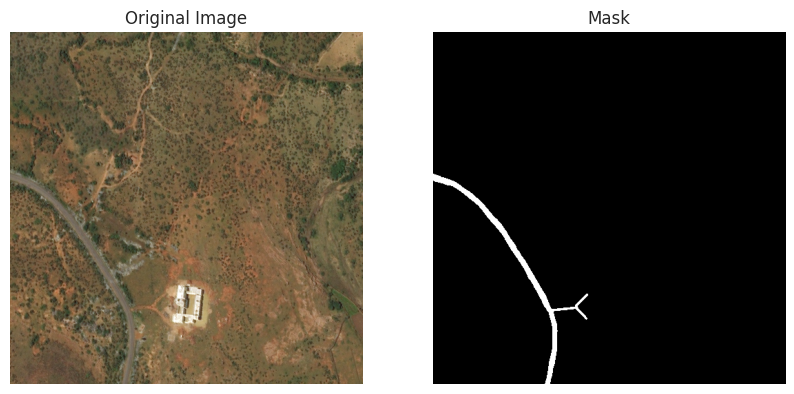

In [110]:
import matplotlib.pyplot as plt

image, mask = train_dataset[19]

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image.permute(1, 2, 0)/ 255.0)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Mask')
plt.imshow(mask.squeeze(), cmap='gray')
plt.axis('off')

plt.show()

Инициализация модели

Мотивация лосса Dice вместо IoU - дисбаланс классов

In [12]:
from monai.losses import DiceLoss

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet(in_channels=3, out_channels=1, init_features=32)
model = model.to(device)
criterion = DiceLoss(to_onehot_y=False, sigmoid=False)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

wandb.init(project="road_segmentation", name="UNet_training")
history = train_model(model, train_loader, val_loader, criterion,
                      optimizer, scheduler, name='best_unet.pth', num_epochs=20)
wandb.finish()

Epoch 1/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 1/20 | Time: 299.16s
Train Loss: 0.8668 | Val Loss: 0.8498
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 2/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 2/20 | Time: 609.83s
Train Loss: 0.8262 | Val Loss: 0.7989
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 3/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 3/20 | Time: 918.31s
Train Loss: 0.7939 | Val Loss: 0.7654
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 4/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 4/20 | Time: 1218.90s
Train Loss: 0.7636 | Val Loss: 0.7748
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 5/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 5/20 | Time: 1514.20s
Train Loss: 0.7360 | Val Loss: 0.6902
Train IoU: 0.0513 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 6/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 6/20 | Time: 1809.38s
Train Loss: 0.7137 | Val Loss: 0.7578
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 7/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 7/20 | Time: 2105.78s
Train Loss: 0.6941 | Val Loss: 0.6674
Train IoU: 0.0511 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 8/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 8/20 | Time: 2404.03s
Train Loss: 0.6817 | Val Loss: 0.6632
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 9/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 9/20 | Time: 2698.92s
Train Loss: 0.6731 | Val Loss: 0.6764
Train IoU: 0.0516 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 10/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 10/20 | Time: 3003.71s
Train Loss: 0.6691 | Val Loss: 0.6766
Train IoU: 0.0511 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 11/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 11/20 | Time: 3313.94s
Train Loss: 0.6689 | Val Loss: 0.6716
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 12/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 12/20 | Time: 3619.45s
Train Loss: 0.6682 | Val Loss: 0.6984
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 13/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 13/20 | Time: 3918.99s
Train Loss: 0.6655 | Val Loss: 0.6820
Train IoU: 0.0514 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 14/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 14/20 | Time: 4222.08s
Train Loss: 0.6620 | Val Loss: 0.6296
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 15/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 15/20 | Time: 4524.93s
Train Loss: 0.6568 | Val Loss: 0.6420
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 16/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 16/20 | Time: 4821.71s
Train Loss: 0.6447 | Val Loss: 0.6118
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 17/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 17/20 | Time: 5119.95s
Train Loss: 0.6298 | Val Loss: 0.5733
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 18/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 18/20 | Time: 5416.60s
Train Loss: 0.6101 | Val Loss: 0.5618
Train IoU: 0.0509 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 19/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 19/20 | Time: 5715.96s
Train Loss: 0.5829 | Val Loss: 0.5200
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 20/20 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 20/20 | Time: 6014.03s
Train Loss: 0.5555 | Val Loss: 0.5153
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


epoch,▁▁▂▂▂▃▃▄▄▄▅▅▅▆▆▇▇▇██
train_iou,▂▁▂▂▄▁▃▁█▂▂▁▆▁▂▁▂▁▁▁
train_loss,█▇▆▆▅▅▄▄▄▄▄▄▃▃▃▃▃▂▂▁
train_recall,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_iou,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_loss,█▇▆▆▅▆▄▄▄▄▄▅▄▃▄▃▂▂▁▁
val_recall,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
epoch,19
train_iou,0.05098
train_loss,0.55552
train_recall,1


In [111]:
def process_image_with_unet(model_path, image_path, resize=512, threshold=0.3):
    model = UNet(in_channels=3, out_channels=1, init_features=32)
    checkpoint = torch.load(model_path, map_location=torch.device('cpu'))
    model.load_state_dict(checkpoint)
    model.eval()
    
    image = Image.open(image_path).convert('RGB')
    image = np.array(image)
    
    transform = A.Compose([
        A.Resize(resize, resize),
        ToTensorV2(),
    ])
    
    input_tensor = transform(image=image)['image'].float().unsqueeze(0)
    
    with torch.no_grad():
        output = model(input_tensor)
    
    if isinstance(output, torch.Tensor):
        mask = torch.where(output > threshold, 1, 0).float()
        mask = mask.squeeze().cpu().numpy()
    
    plt.figure(figsize=(20, 10))
    
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(image)
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.title('Predicted Mask')
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    
    plt.show()


Посмотрим на предсказание

/tmp/ipykernel_54067/2243770428.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=torch.device('cpu'))


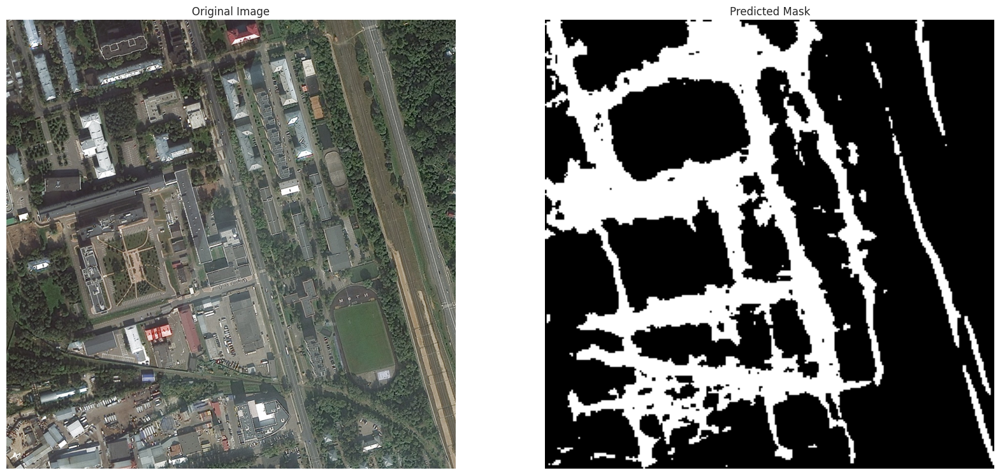

In [112]:
process_image_with_unet('best_unet.pth', 'mipt.jpg', 256, 0.99)

Как видим, есть неточности, предсказнные дороги слишком толстые. Модель слишком уверена в предсказании, все белые точки имеют предсказанное значение выше 0.99. При этом, что очень хорошо, дороги довольно плотные и разывов не так много. Попробуем подредактировать лосс и доучим модель

In [53]:
from monai.losses import DiceCELoss, FocalLoss

class CustomLoss(nn.Module):
    def __init__(self, alpha=0.8, gamma=2.0):
        super().__init__()
        self.alpha = alpha
        self.dice_ce = DiceCELoss(to_onehot_y=False, sigmoid=False, lambda_dice=0.7, lambda_ce=0.3)
        self.focal = FocalLoss(to_onehot_y=False, gamma=gamma)

    def forward(self, preds, targets):
        dice_ce_loss = self.dice_ce(preds, targets)
        focal_loss = self.focal(preds, targets)
        return self.alpha * dice_ce_loss + (1 - self.alpha) * focal_loss

Итак, будем дообучивать модель

In [55]:
model = UNet(in_channels=3, out_channels=1, init_features=32)
checkpoint = torch.load('best_unet.pth', map_location=torch.device('cpu'))
model.load_state_dict(checkpoint)
model = model.to(device)

criterion = CustomLoss(alpha=0.8, gamma=2.0).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=1e-6)

wandb.init(project="road_segmentation", name="UNet_training_new_loss")
history = train_model(model, train_loader, val_loader, criterion,
                      optimizer, scheduler, name='best_unet_new_loss.pth', num_epochs=10)
wandb.finish()

/tmp/ipykernel_54067/3892111588.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('best_unet.pth', map_location=torch.device('cpu'))


Epoch 1/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 1/10 | Time: 261.32s
Train Loss: 0.5093 | Val Loss: 0.4735
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 2/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 2/10 | Time: 524.58s
Train Loss: 0.4926 | Val Loss: 0.4855
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 3/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 3/10 | Time: 790.86s
Train Loss: 0.4762 | Val Loss: 0.4569
Train IoU: 0.0512 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 4/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 4/10 | Time: 1049.14s
Train Loss: 0.4584 | Val Loss: 0.4467
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 5/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 5/10 | Time: 1305.25s
Train Loss: 0.4474 | Val Loss: 0.4305
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 6/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 6/10 | Time: 1563.90s
Train Loss: 0.4379 | Val Loss: 0.4356
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 7/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 7/10 | Time: 1822.99s
Train Loss: 0.4316 | Val Loss: 0.4217
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 8/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 8/10 | Time: 2080.85s
Train Loss: 0.4243 | Val Loss: 0.4205
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 9/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 9/10 | Time: 2339.74s
Train Loss: 0.4225 | Val Loss: 0.4195
Train IoU: 0.0509 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 10/10 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 10/10 | Time: 2599.36s
Train Loss: 0.4199 | Val Loss: 0.4175
Train IoU: 0.0509 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


epoch,▁▂▃▃▄▅▆▆▇█
train_iou,▂▂█▂▃▄▂▃▁▁
train_loss,█▇▅▄▃▂▂▁▁▁
train_recall,▁▁▁▁▁▁▁▁▁▁
val_iou,▁▁▁▁▁▁▁▁▁▁
val_loss,▇█▅▄▂▃▁▁▁▁
val_recall,▁▁▁▁▁▁▁▁▁▁
epoch,9
train_iou,0.05094
train_loss,0.41992
train_recall,1


/tmp/ipykernel_54067/2243770428.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=torch.device('cpu'))


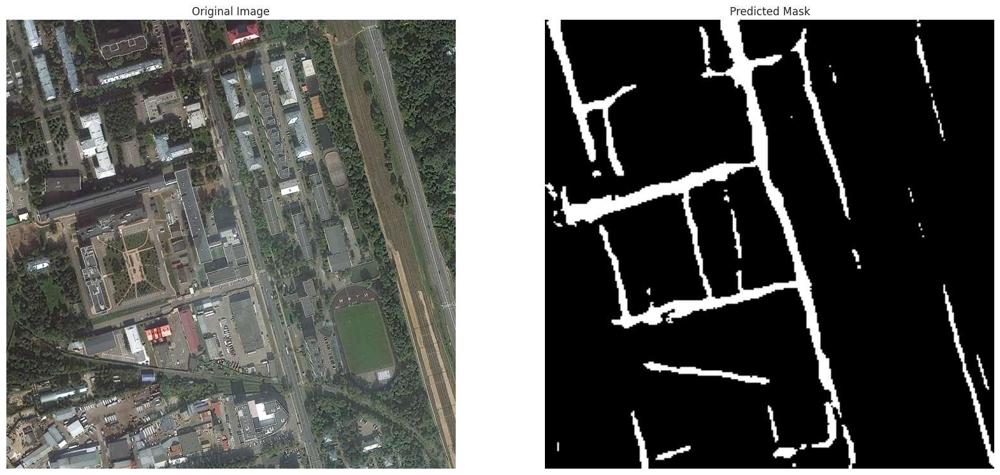

In [116]:
process_image_with_unet('best_unet_new_loss.pth', 'mipt.jpg', 256, 0.5)

Уже шумов меньше, но модели не хватает деталей. Попробуем взять больший размер изображения

In [82]:
train_transform = A.Compose([
    A.Resize(512, 512),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2, p=0.5),
    ToTensorV2(),
])

val_transform = A.Compose([
    A.Resize(512, 512),
    ToTensorV2(),
])

train_dataset = RoadDataset(train_images_filenames, train_images_dir,
                               train_masks_dir,
                               transform=train_transform)
val_dataset = RoadDataset(val_images_filenames, val_images_dir,
                             val_masks_dir,
                             transform=val_transform)
batch_size = 16
train_loader = DataLoader(train_dataset, num_workers=4, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, num_workers=4, batch_size=batch_size, shuffle=False)

Модель

In [85]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = UNet(in_channels=3, out_channels=1, init_features=32)
checkpoint = torch.load('best_unet_new_loss.pth', map_location=torch.device('cpu'))
model.load_state_dict(checkpoint)
model = model.to(device)

criterion = CustomLoss(alpha=0.8, gamma=2.0).to(device)
optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-6)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=5, eta_min=1e-5)

wandb.init(project="road_segmentation", name="UNet_scale")
history = train_model(model, train_loader, val_loader, criterion,
                      optimizer, scheduler, name='best_unet_scale.pth', num_epochs=5)
wandb.finish()

/tmp/ipykernel_54067/309568547.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('best_unet_new_loss.pth', map_location=torch.device('cpu'))


Epoch 1/5 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 1/5 | Time: 468.55s
Train Loss: 0.4149 | Val Loss: 0.4066
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 2/5 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 2/5 | Time: 921.56s
Train Loss: 0.3984 | Val Loss: 0.3880
Train IoU: 0.0511 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 3/5 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 3/5 | Time: 1320.23s
Train Loss: 0.3897 | Val Loss: 0.3776
Train IoU: 0.0512 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 4/5 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Epoch 4/5 | Time: 1709.72s
Train Loss: 0.3826 | Val Loss: 0.3794
Train IoU: 0.0511 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


Epoch 5/5 - Last Loss: ???:   0%|          | 0/326 [00:00<?, ?it/s]

Model saved!
Epoch 5/5 | Time: 2103.89s
Train Loss: 0.3774 | Val Loss: 0.3711
Train IoU: 0.0510 | Val IoU: 0.0498
Train Recall: 1.0000 | Val Recall: 1.0000


epoch,▁▃▅▆█
train_iou,▃▆█▄▁
train_loss,█▅▃▂▁
train_recall,▁▁▁▁▁
val_iou,▁▁▁▁▁
val_loss,█▄▂▃▁
val_recall,▁▁▁▁▁
epoch,4
train_iou,0.05095
train_loss,0.37738
train_recall,1


/tmp/ipykernel_54067/2243770428.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(model_path, map_location=torch.device('cpu'))


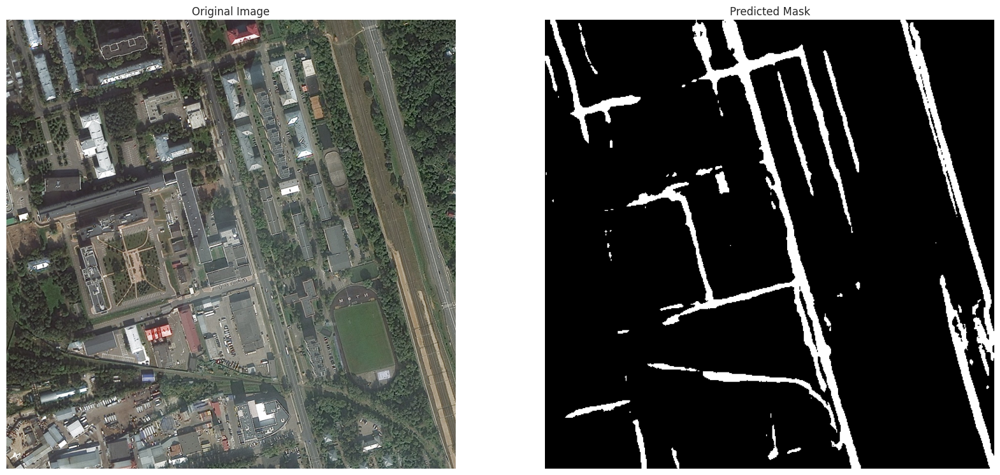

In [139]:
process_image_with_unet('best_unet_scale.pth', 'mipt.jpg', 512, 0.9)

Лучше. Дороги даже прямые и четкие. К сожалению, тени мешают, из за этого дороги прерываются. Из идей - можно усреднить спутниковые снимки разных времен

Теперь предсказание на всем Долгопрудном

In [120]:
def split_image(image, tile_size=1024, overlap=50):
    """Разбивает изображение на квадраты tile_size x tile_size с перекрытием overlap"""
    h, w, _ = image.shape
    step = tile_size - overlap
    tiles = []
    positions = []
    
    for y in range(0, h - overlap, step):
        for x in range(0, w - overlap, step):
            tile = image[y:y+tile_size, x:x+tile_size]
            if tile.shape[0] != tile_size or tile.shape[1] != tile_size:
                # Дополняем края, если не хватает
                tile = cv2.copyMakeBorder(tile, 0, tile_size - tile.shape[0], 0, tile_size - tile.shape[1], cv2.BORDER_REFLECT)
            tiles.append(tile)
            positions.append((x, y))
    
    return tiles, positions, (h, w)

def merge_masks(masks, positions, original_size, tile_size=1024, overlap=50):
    """Собирает предсказанные маски обратно в одно изображение"""
    h, w = original_size
    step = tile_size - overlap
    
    stitched_mask = np.zeros((h, w), dtype=np.float32)
    count_map = np.zeros((h, w), dtype=np.float32)
    
    for mask, (x, y) in zip(masks, positions):
        #mask = mask.squeeze().cpu().numpy()
        mask = mask[:min(tile_size, h - y), :min(tile_size, w - x)]  # Обрезаем края, если нужно
        mask = mask.astype(np.float32)
        stitched_mask[y:y+mask.shape[0], x:x+mask.shape[1]] += mask
        count_map[y:y+mask.shape[0], x:x+mask.shape[1]] += 1
    
    stitched_mask[count_map > 0] /= count_map[count_map > 0]  # Усредняем наложенные области
    return (stitched_mask * 255).astype(np.uint8)

def predict(tile):
    transform = A.Compose([
        A.Resize(512, 512),
        ToTensorV2(),
    ])

    input_tensor = transform(image=tile)['image'].float().unsqueeze(0)

    with torch.no_grad():
        output = model(input_tensor)

    output = output.squeeze().cpu().numpy()  # Shape: (512, 512)

    output_resized = cv2.resize(output, (1024, 1024), interpolation=cv2.INTER_LINEAR)

    return output_resized

Подсчет

In [121]:
image = cv2.imread("dolgoprydni.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
tiles, positions, original_size = split_image(image)
    
model = UNet(in_channels=3, out_channels=1, init_features=32)
checkpoint = torch.load('best_unet_scale.pth', map_location=torch.device('cpu'))
model.load_state_dict(checkpoint)
model.eval()
    
masks = [predict(tile) for tile in tqdm(tiles)]
    
final_mask = merge_masks(masks, positions, original_size)
    
cv2.imwrite("segmented_roads.png", final_mask)

/tmp/ipykernel_54067/2144766358.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('best_unet_scale.pth', map_location=torch.device('cpu'))


  0%|          | 0/45 [00:00<?, ?it/s]

True

Итого

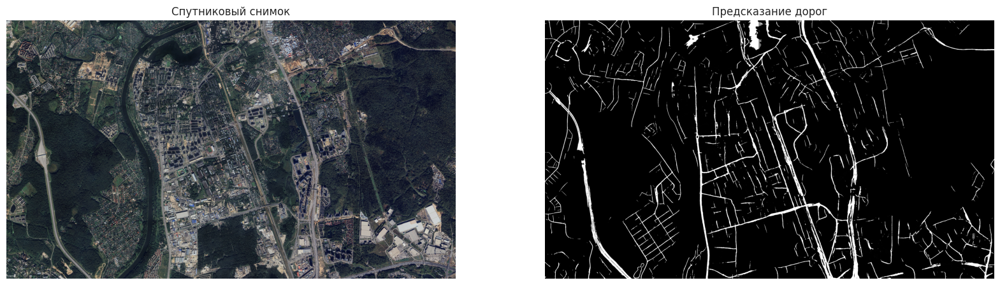

In [133]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title('Спутниковый снимок')
plt.imshow(Image.open("dolgoprydni.jpg"))
plt.axis('off')
    
plt.subplot(1, 2, 2)
plt.title('Предсказание дорог')
plt.imshow(Image.open("segmented_roads.png"), cmap='gray')
plt.axis('off')
    
plt.show()

Логи обучения есть тут

https://api.wandb.ai/links/juequ/2vly8wpm